<img src="https://www.iscte-iul.pt/assets/images/logo_iscte_detailed.svg" style="width: 450px;margin-top:30px;" align ="center">

<div style= "font-size: 40px;  margin-top:40px; font-weight:bold; font-family: 'Avenir Next LT Pro', sans-serif;"><center>Challenge 2 - Part 4: <strong>Out-of-sample Prediction</strong></center></div>
<div style= "font-size: 40px; font-weight:bold; font-family: 'Avenir Next LT Pro', sans-serif;"><center>for cats_and_dogs dataset using neural networks</center></div>

<div style= "font-size: 27px;font-weight:bold;line-height: 1.1; margin-top:40px; font-family: 'Avenir Next LT Pro', sans-serif;"><center>Aprendizagem Profunda para Visão por Computador 2024/2025</center></div> <br>

   <div style= "font-size: 20px;font-weight:bold; font-family: 'Avenir Next LT Pro', sans-serif;"><center> Grupo 7:</center></div>
   <div><center> Diogo Freitas | 104841 </center></div>
   <div><center> João Francisco Botas | 104782 </center></div>
   <div><center> Miguel Gonçalves | 105944 </center></div>
   <div><center> Ricardo Galvão | 105285 </center></div>

<!DOCTYPE html>
<html lang="en">
<head>
    <meta charset="UTF-8">
    <meta name="viewport" content="width=device-width, initial-scale=1.0">
    <style>
        body {
            font-family: Arial, sans-serif;
            background-color: #f4f4f4;
            color: #333;
            margin: 0;
            padding: 20px;
            line-height: 1.6;
        }
        ol {
            counter-reset: section;
            list-style: none;
            padding-left: 0;
        }
        /* First-level list */
        ol > li {
            counter-increment: section;
            margin-bottom: 10px;
            padding-left: 0;
        }
        ol > li::before {
            content: counters(section, ".") " ";
            font-weight: bold;
        }
        /* Second-level list */
        ol ol {
            counter-reset: subsection;
            padding-left: 20px;
            margin-top: 5px;
        }
        ol ol > li {
            counter-increment: subsection;
            margin-bottom: 5px;
            padding-left: 10px;
        }
        ol ol > li::before {
            content: counters(section, ".") "." counter(subsection) " ";
            font-weight: bold;
        }
        /* Third-level list */
        ol ol ol {
            counter-reset: subsubsection;
            padding-left: 40px;
            margin-top: 5px;
        }
        ol ol ol > li {
            counter-increment: subsubsection;
            margin-bottom: 5px;
            padding-left: 10px;
            font-size: 0.9em; /* Make font size smaller */
            font-weight: normal; /* Remove bold styling */
        }
        ol ol ol > li::before {
            content: counters(section, ".") "." counter(subsection) "." counter(subsubsection) " ";
            font-weight: bold;
        }
        a {
            text-decoration: none;
            color: #007BFF;
            font-weight: bold;
        }
        a:hover {
            color: #0056b3;
        }
        footer {
            margin-top: 50px;
        }
    </style>
</head>
<body>

<h2><b>Índice</b></h2>
<ol>
    <li><a href="#1">Objetivo desta parte</a></li>
    <li><a href="#2">Setup para desenvolvimento do projeto</a></li>
        <ol>
            <li><a href="#2.1">Criação de um conjunto de Validação</a></li>
        </ol>
    <li><a href="#3">Rede neuronal MobileNetV3Large</a></li>
        <ol>
            <li><a href="#3.1">Construir o modelo</a></li>
            <li><a href="#3.2">Compilar a rede</a></li>
            <li><a href="#3.3">Treinar o modelo – max 50 épocas, de pref. a usar callbacks</a></li>
            <li><a href="#3.4">Gráfico que mostre a evolução do treino</a></li>
            <li><a href="#3.5">Cálculo dos acertos no conjunto de teste</a></li>
            <li><a href="#3.6">Mostrar a matriz de confusão</a></li>
            <li><a href="#3.7">Saliencia/Heatmap</a></li>
        </ol>
    <li><a href="#4">Por Fazer...</a></li>
</ol>

<footer></footer>

</body>
</html>

# <a class='anchor' id='1'></a>

> # **1. Objetivo desta parte** 

Dizer os objetivos

# <a class='anchor' id='2'></a>

> # **2. Setup para desenvolvimento do projeto**

In [44]:
import tensorflow as tf
import keras
from keras import layers

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
import cv2

import seaborn as sns
import sys
import os
from pathlib import Path

import nbformat
from nbconvert import PythonExporter

from tf_keras_vis.saliency import Saliency
from tf_keras_vis.utils import normalize
from tf_keras_vis.utils.scores import BinaryScore

from tensorflow.keras.models import Model

from keras.src.applications.mobilenet_v3 import decode_predictions
from tensorflow.keras.applications import MobileNetV3Small, MobileNetV3Large, VGG16

from IPython.display import display, Markdown

In [45]:
# Configurar a seed do TensorFlow
tf.keras.utils.set_random_seed(42)
# Definir a seed global para a operação de GPU
tf.config.experimental.enable_op_determinism()

# tf.debugging.set_log_device_placement(True)
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [46]:
!nvidia-smi # Verifica a GPU
!nvcc --version   # Verifica a versão do CUDA

Sat Mar 29 19:21:01 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 570.86.17              Driver Version: 572.42         CUDA Version: 12.8     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4060        On  |   00000000:01:00.0  On |                  N/A |
|  0%   52C    P8             N/A /  115W |    3988MiB /   8188MiB |     34%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [47]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        for gpu in gpus:
            tf.config.experimental.set_memory_growth(gpu, True)  # Aloca memória dinamicamente
        print("Memória da GPU configurada para crescimento dinâmico.")
    except RuntimeError as e:
        print(e)

Memória da GPU configurada para crescimento dinâmico.


In [48]:
tf.config.optimizer.set_jit(True)  # Ativa JIT (Just-in-Time) Compilation
print("XLA ativado.")

XLA ativado.


In [49]:
# Tamanho das imagens
img_height = 256
img_width = 256
labels = ["cat", "dog"]

# Localização dos dados
path = Path(r"../datasets/out_of_sample_cropped/")

# Carregamento dos dados
out_of_sample = keras.utils.image_dataset_from_directory(
    path,
    label_mode="binary",
    class_names=["cats", "dogs"],
    image_size=(img_height, img_width),
)


Found 16 files belonging to 2 classes.


In [50]:
oos_images = []
oos_class = []
for batch_x, batch_y in out_of_sample:
    for image, class_ in zip(batch_x, batch_y):
        oos_images.append(np.array(np.expand_dims(image, axis=0)))
        oos_class.append(int(class_))

In [51]:
modelosDisponiveis = list(Path("models").iterdir())
for i, j in enumerate(modelosDisponiveis):
    print(f"{i}: {j.name}")

0: augmented_model.keras
1: baseline_model.keras
2: conv2d_model.keras
3: dropout_model.keras
4: final_model.keras
5: MobileNetV3Large.keras
6: MobileNetV3Small.keras
7: ResNet152V2.keras
8: ResNet50.keras
9: VGG16.keras


In [52]:
# Selecionar o modelo a utilizar
FinalModel = modelosDisponiveis[4]
MobileNetV3LargeTranfer = modelosDisponiveis[5]

markdown_text = f"""
<a class='anchor' id='{FinalModel}'></a>

> # **3. Rede neuronal {FinalModel} & {MobileNetV3LargeTranfer}**
"""

display(Markdown(markdown_text))


<a class='anchor' id='models/final_model.keras'></a>

> # **3. Rede neuronal models/final_model.keras & models/MobileNetV3Large.keras**


In [53]:
model1 = keras.saving.load_model(FinalModel)
model2 = keras.saving.load_model(MobileNetV3LargeTranfer)

preds1, preds2 = model1.predict(out_of_sample).squeeze(), model2.predict(out_of_sample).squeeze()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 454ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


# <a class='anchor' id='3.6'></a>

> ## **f) Mostrar a matriz de confusão**

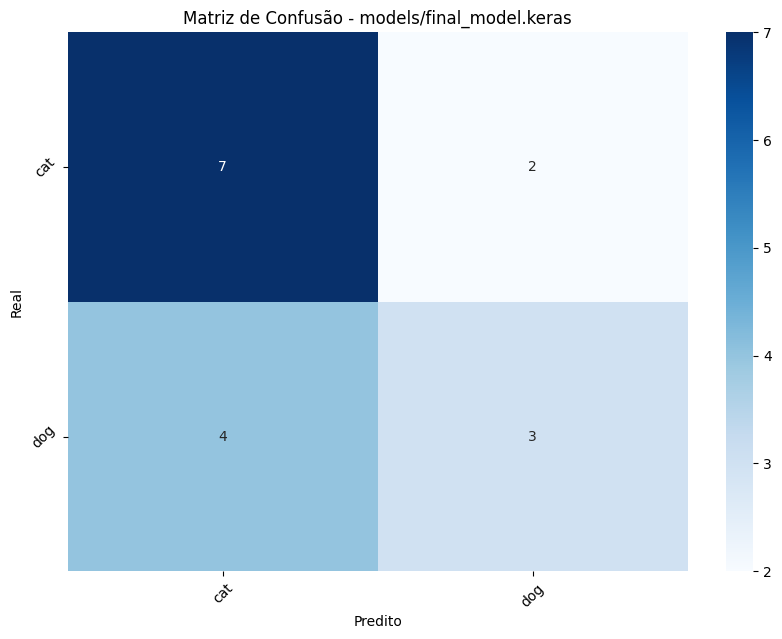

In [54]:
# Predições e matriz de confusão
y_pred = preds1
y_pred_classes = y_pred>0.5
y_true_classes = oos_class

cm = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predito')
plt.ylabel('Real')
plt.title(f'Matriz de Confusão - {FinalModel}')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

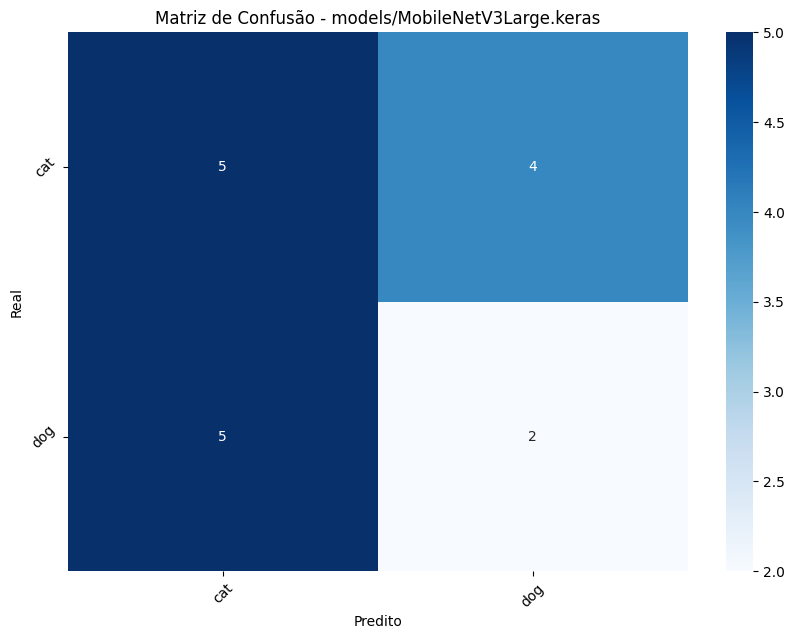

In [55]:
# Predições e matriz de confusão
y_pred = preds2
y_pred_classes = y_pred>0.5
y_true_classes = oos_class

cm = confusion_matrix(y_true_classes, y_pred_classes)
plt.figure(figsize=(10, 7))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predito')
plt.ylabel('Real')
plt.title(f'Matriz de Confusão - {MobileNetV3LargeTranfer}')
plt.xticks(rotation=45)
plt.yticks(rotation=45)
plt.show()

# <a class='anchor' id='3.7'></a>

> ## **g) Saliencia/Heatmap**

In [56]:
linear_model1 = tf.keras.models.Model(inputs=[model1.layers[0].input], outputs=[model1.layers[-2].output])
linear_model2 = tf.keras.models.Model(inputs=[model2.layers[0].input], outputs=[model2.layers[-2].output])

In [57]:
score = BinaryScore(0)
saliency1 = Saliency(model1, clone=False)
saliency2 = Saliency(model2, clone=False)

In [58]:
# Erradas
bad_preds1 = ((preds1>0.5).astype(int) != y_true_classes).nonzero()[0]
bad_preds2 = ((preds2>0.5).astype(int) != y_true_classes).nonzero()[0]

In [ ]:
for img_id in bad_preds1:
    # Load and preprocess an example image
    img = oos_images[img_id]  # array
    img_array = np.expand_dims(img, axis = 0)  # Normalize and add batch dimension, now numpy array
    # Compute saliency map
    saliency_map = saliency1(score, img_array, smooth_samples=20, smooth_noise=0.2, normalize_map=True)
    # saliency_map = normalize(saliency_map)
    # Overlay saliency map on original image
    heatmap = cv2.cvtColor(cv2.applyColorMap(np.uint8(np.floor(saliency_map*255)).squeeze(), cv2.COLORMAP_VIRIDIS), cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(heatmap, 0.7, np.uint8(img), 0.3, 0)
    
    # Display results
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    ax[0].imshow(img/255)
    ax[0].set_title(f"Original Image: {labels[int(oos_class[img_id])]}")
    ax[0].axis("off")
    
    ax[1].imshow(overlay)
    ax[1].set_title(f"Probabilidade {labels[1]}: {preds1[img_id]:.3f}")
    ax[1].axis("off")

    # Adicionar um título geral à figura
    plt.suptitle(f'Modelo utilizado - {FinalModel}', fontsize=16, fontweight='bold')
    
    plt.show()


ValueError: seed_input's shape is invalid. model-input index: 0, model-input shape: (None, 256, 256, 3), seed_input shape: (1, 1, 256, 256, 3).

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: input_layer_2
Received: inputs=['Tensor(shape=(1, 256, 256, 3))']
  warnings.warn(msg)


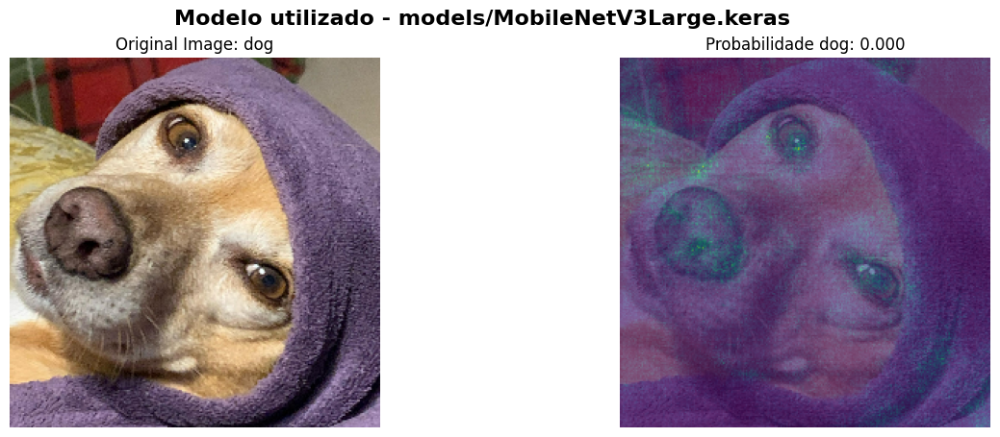

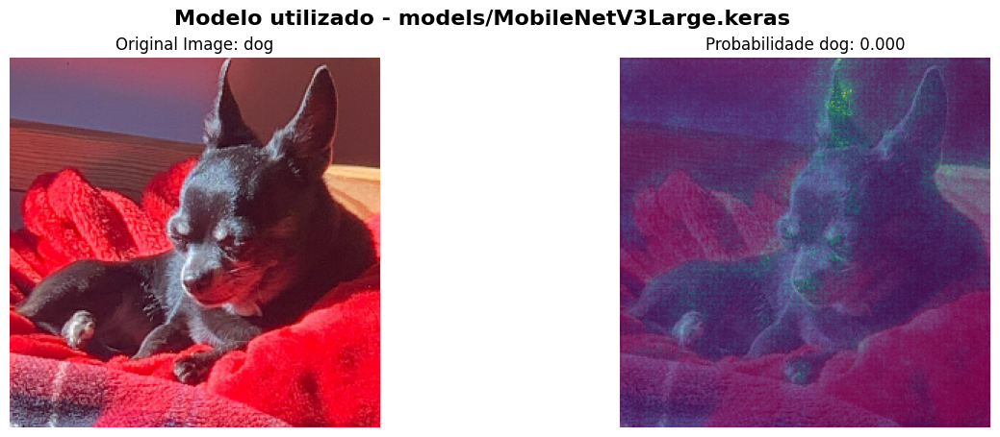

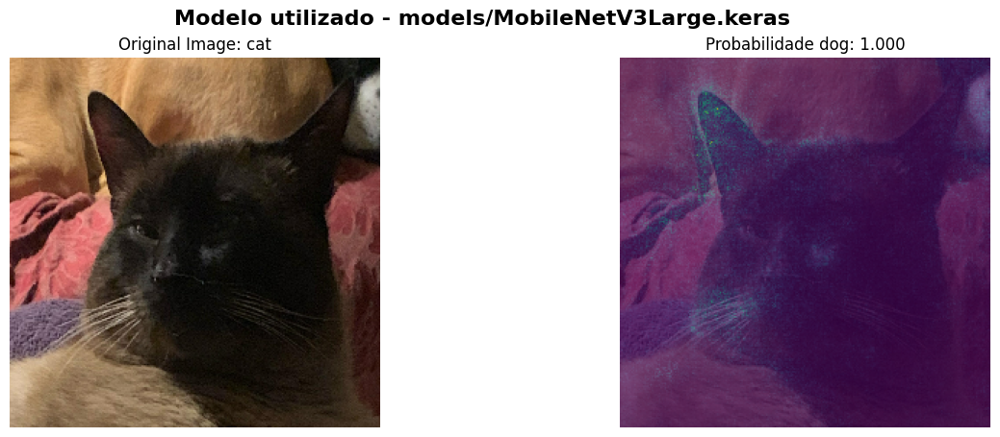

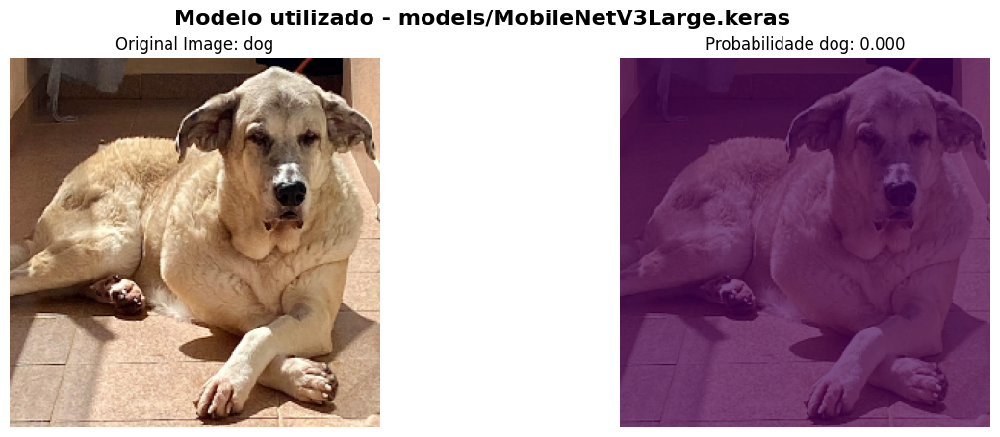

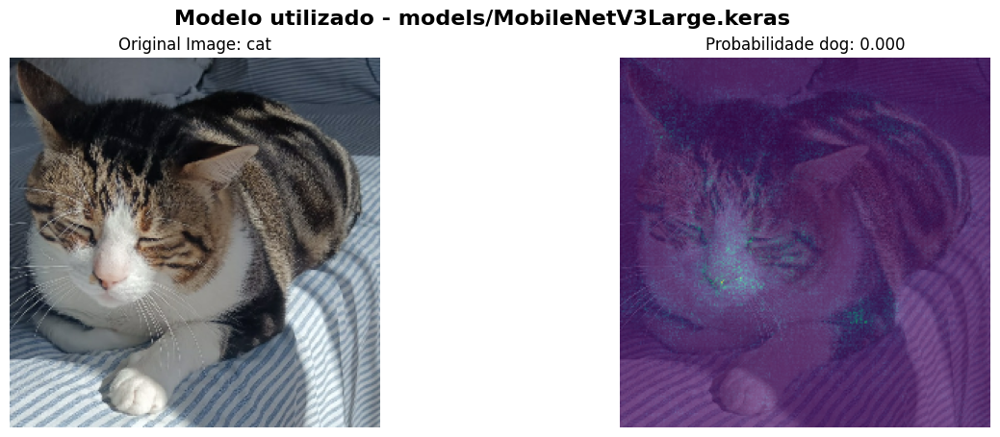

...

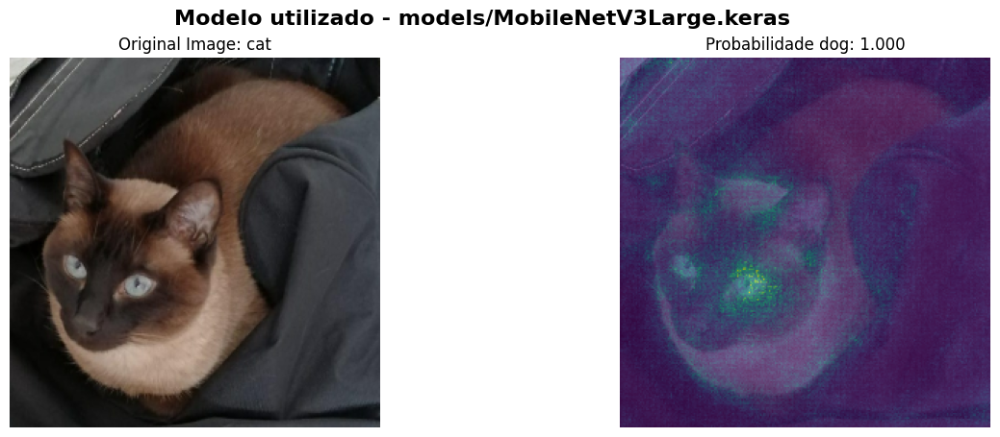

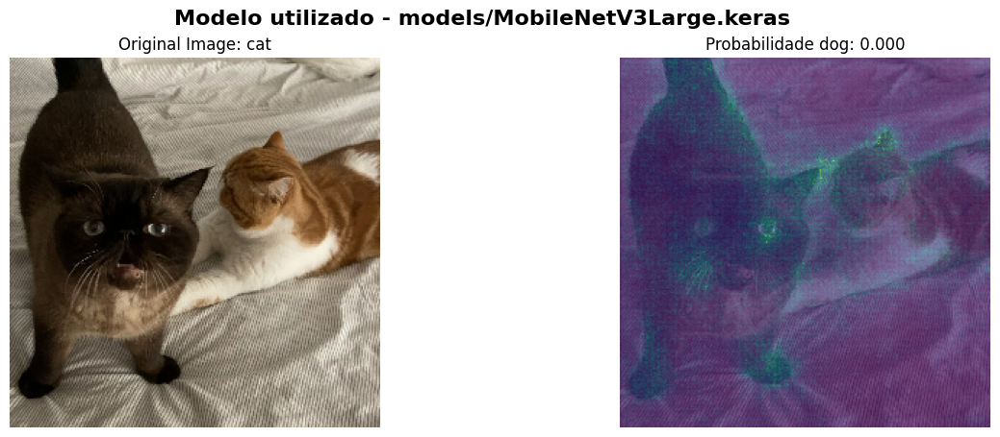

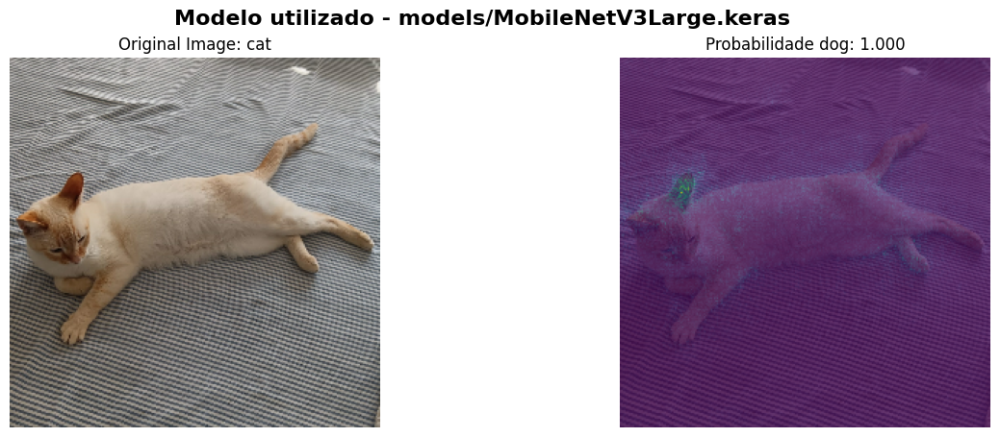

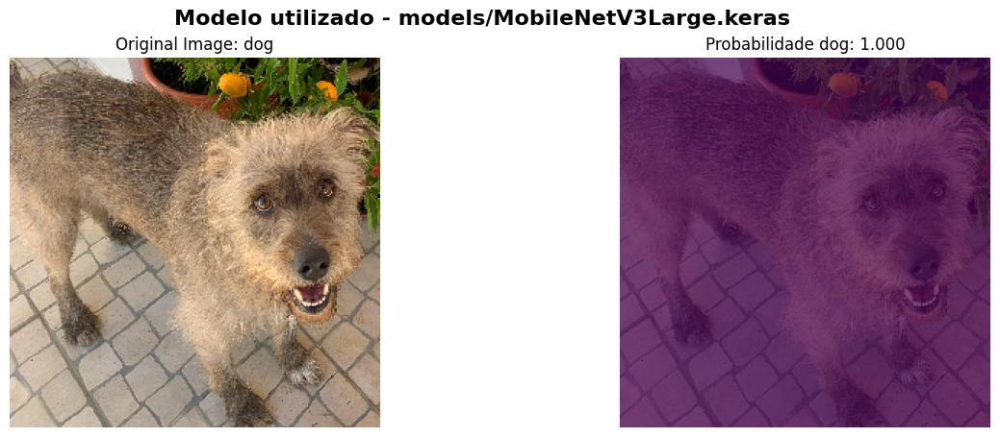

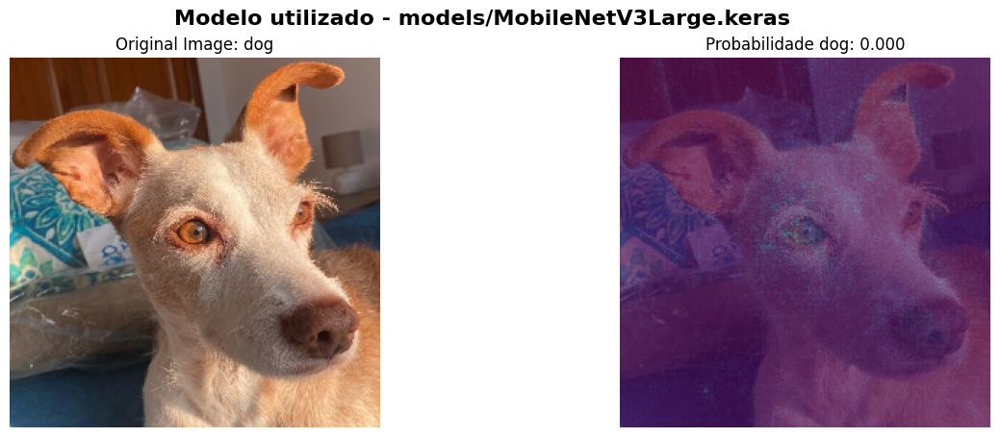

In [ ]:
for img_id in range(len(oos_images)):
    # Load and preprocess an example image
    img = oos_images[img_id]  # array
    img_array = np.expand_dims(img, axis = 0)  # Normalize and add batch dimension, now numpy array
    # Compute saliency map
    saliency_map = saliency2(score, img_array, smooth_samples=20, smooth_noise=0.2, normalize_map=True)
    # saliency_map = normalize(saliency_map)
    # Overlay saliency map on original image
    heatmap = cv2.cvtColor(cv2.applyColorMap(np.uint8(np.floor(saliency_map*255)).squeeze(), cv2.COLORMAP_VIRIDIS), cv2.COLOR_BGR2RGB)
    overlay = cv2.addWeighted(heatmap, 0.7, np.uint8(img), 0.3, 0)
    
    # Display results
    fig, ax = plt.subplots(1, 2, figsize=(15, 5))
    ax[0].imshow(img/255)
    ax[0].set_title(f"Original Image: {labels[int(oos_class[img_id])]}")
    ax[0].axis("off")
    
    ax[1].imshow(overlay)
    ax[1].set_title(f"Probabilidade {labels[1]}: {preds2[img_id]:.3f}")
    ax[1].axis("off")

    # Adicionar um título geral à figura
    plt.suptitle(f'Modelo utilizado - {MobileNetV3LargeTranfer}', fontsize=16, fontweight='bold')
    
    plt.show()
